# Eclipsing binary

Let's fit an eclipsing binary light curve with `starry`.

In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import exoplanet as xo
import starry
np.random.seed(12)

## Generate two maps

The first is that of an unspotted solar-like star with quadratic limb darkening. Note that since we're going to use these maps below in the `pymc3` run, we declare it within the context of a `pymc3.Model()` instance.

In [3]:
with pm.Model() as model:
    A = starry.Primary(
            starry.Map(
                udeg=2
            ),
            r=1.0,
            m=1.0,
            L=1.0
        )
    A.map[1] = 0.40
    A.map[2] = 0.25
    
A.map.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


The second is that of a smaller star (say, an M dwarf) on a short period orbit with a large mid-latitude spot. In this notebook, we will attempt to infer the map of this star. Note again that we define it within the context of `model`:

In [4]:
with model:
    B = starry.Secondary(
            starry.Map(
                ydeg=5,
                inc=60.0
            ),
            r=0.4,
            m=0.5,
            L=0.1,
            porb=5.0,
            prot=1.77,
            t0=0.15,
            inc=89.0
        )
    B.map.add_spot(amp=-0.2, lat=30, lon=60)

B_true_map = B.map[1:, :].eval()
B.map.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


Even with occultations, there are significant degeneracies in the mapping problem, so we need a good prior. Let's assume we have some information about the power spectrum of the star, which is the sum of the squares of the spherical harmonic coefficients at each degree.

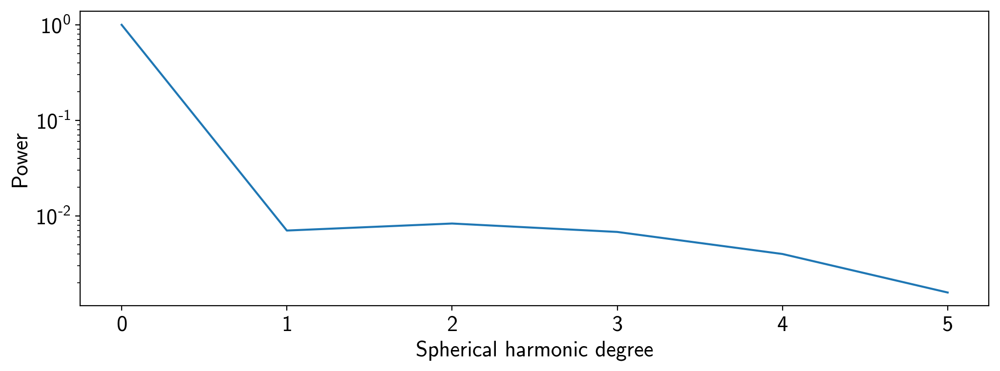

In [5]:
plt.plot([np.sum(B.map[l, :].eval() ** 2) for l in range(B.map.ydeg + 1)])
plt.yscale("log")
plt.xlabel("Spherical harmonic degree")
plt.ylabel("Power");

The power is (very) roughly flat at $10^{-2}$ for $l>0$, so that will be the **variance** on the Gaussian prior on the spherical harmonic coefficients.

## Generate a light curve

Let's generate a synthetic light curve over several days.

In [6]:
with model:
    sys = starry.System(A, B)
    
# Compute the light curve    
t = np.linspace(-8, 8, 10000)
flux_true = sys.flux(t).eval()

# Add noise
sigma = 0.001
flux = flux_true + sigma * np.random.randn(len(t))

/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2339: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[0][inputs[2:]] = inputs[1]


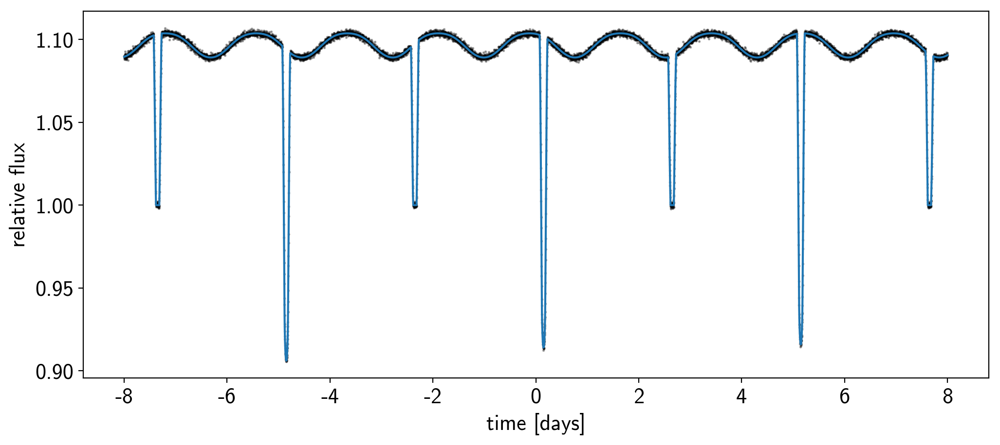

In [7]:
fig, ax = plt.subplots(1, figsize=(12, 5))
ax.plot(t, flux, 'k.', alpha=0.3, ms=2)
ax.plot(t, flux_true)
ax.set_xlabel("time [days]")
ax.set_ylabel("relative flux");

## Let's define the `pymc3` model

In [8]:
with model:

    # The Ylm coefficients with a simple gaussian prior
    ncoeff = B.map.Ny - 1
    mu = np.zeros(ncoeff)
    cov = 1e-2 * np.eye(ncoeff)
    Ylm = pm.MvNormal("Ylm", mu, cov, shape=(ncoeff,))
    B.map[1:, :] = Ylm
    
    # Compute the flux
    flux_model = sys.flux(t=t)
    
    # Track some values for plotting later
    pm.Deterministic("flux_model", flux_model)

    # Save our initial guess
    flux_model_guess = xo.eval_in_model(flux_model)

    # The likelihood function assuming known Gaussian uncertainty
    pm.Normal("obs", mu=flux_model, sd=sigma, observed=flux)

/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2339: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[0][inputs[2:]] = inputs[1]
/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2339: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[0][inputs[2:]] = inputs[1]


Run a quick gradient descent to find the MAP solution:

In [9]:
with model:
    map_soln = xo.optimize()

optimizing logp for variables: ['Ylm']


/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2339: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[0][inputs[2:]] = inputs[1]


message: Optimization terminated successfully.
logp: -119877.69769281788 -> 55000.637173531395


Plot the model:

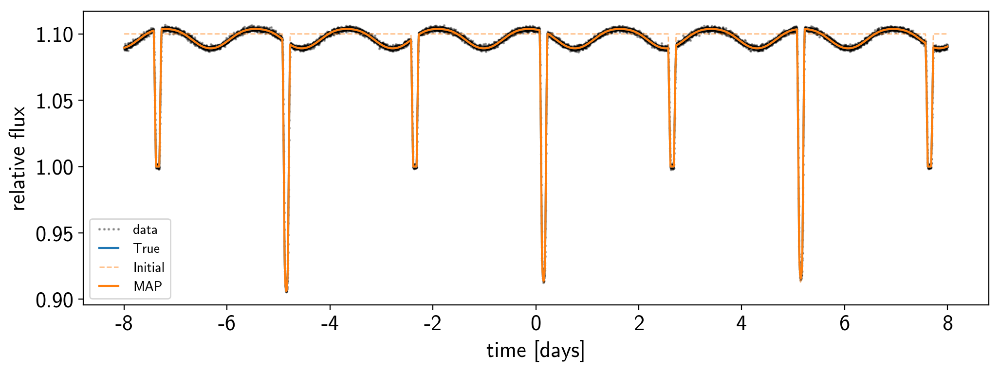

In [10]:
plt.plot(t, flux, 'k.', alpha=0.3, ms=2, label="data")
plt.plot(t, flux_true, "C0-", label="True")
plt.plot(t, flux_model_guess, "C1--", lw=1, alpha=0.5, label="Initial")
plt.plot(t, xo.eval_in_model(flux_model, map_soln, model=model), "C1-", label="MAP")
plt.legend(fontsize=10, numpoints=5)
plt.xlabel("time [days]")
plt.ylabel("relative flux");

Plot the corresponding map for `B`: note that we recover the spot!

In [11]:
map = starry.Map(ydeg=5)
map.inc = 60
map[1:, :] = map_soln['Ylm']
map.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


## NUTS sampling

Let's run the NUTS sampler to get posteriors on the map of `B`.

In [12]:
sampler = xo.PyMC3Sampler(window=100, finish=200, cores=1)
with model:
    burnin = sampler.tune(tune=2000, start=map_soln, step_kwargs=dict(target_accept=0.9))
    trace = sampler.sample(draws=2000)

/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2339: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[0][inputs[2:]] = inputs[1]
100%|██████████| 202/202 [00:13<00:00, 22.17it/s]
Sequential sampling (2 chains in 1 job)
NUTS: [Ylm]
100%|██████████| 2000/2000 [01:44<00:00, 21.90it/s]


Things appear to have converged well:

In [17]:
varnames = ["Ylm"]
pm.summary(trace, varnames=varnames)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
Ylm__0,0.008411,0.041303,0.000522,-0.068789,0.092296,6189.855472,0.999906
Ylm__1,-0.040421,0.025983,0.000364,-0.088121,0.014134,5620.084497,0.999789
Ylm__2,-0.070917,0.045724,0.000554,-0.158938,0.022585,5668.174201,0.999796
Ylm__3,-0.016717,0.045042,0.000595,-0.101413,0.074847,5667.745373,0.999808
Ylm__4,-0.038187,0.052417,0.000652,-0.138353,0.062059,6376.980762,1.000037
Ylm__5,-0.023242,0.055661,0.000768,-0.134001,0.086173,5800.735332,0.999906
Ylm__6,-0.060263,0.060017,0.000705,-0.174125,0.057922,6008.796087,0.999815
Ylm__7,-0.067541,0.043057,0.000505,-0.150908,0.014598,6253.065739,0.999857
Ylm__8,-0.036137,0.040585,0.000474,-0.118943,0.039454,6196.522447,0.999750
Ylm__9,-0.046880,0.050332,0.000642,-0.148764,0.048840,5759.677385,0.999821


Display the corner plot for a few of the dimensions. Note the strong degeneracies that are still present.

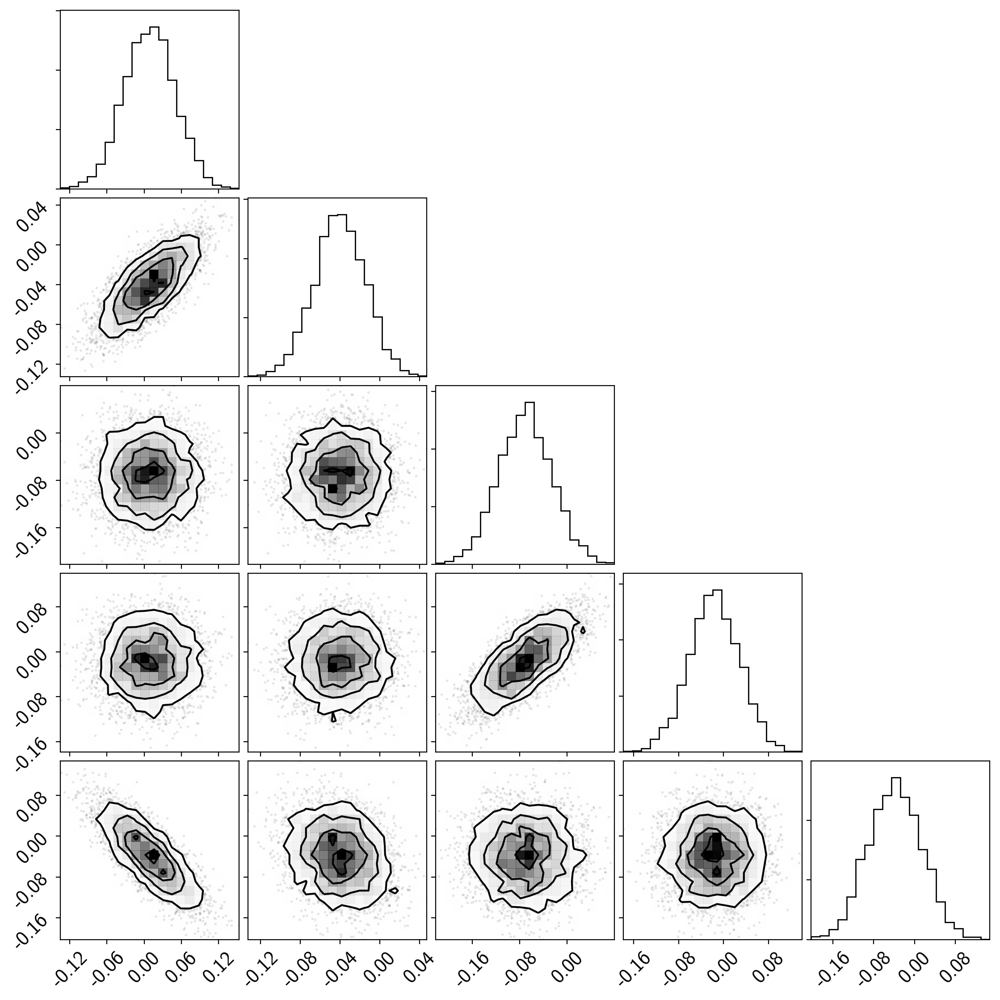

In [18]:
import corner
samples = pm.trace_to_dataframe(trace, varnames=varnames)
corner.corner(np.array(samples)[:, :5]);

Plot the model for 24 random samples:

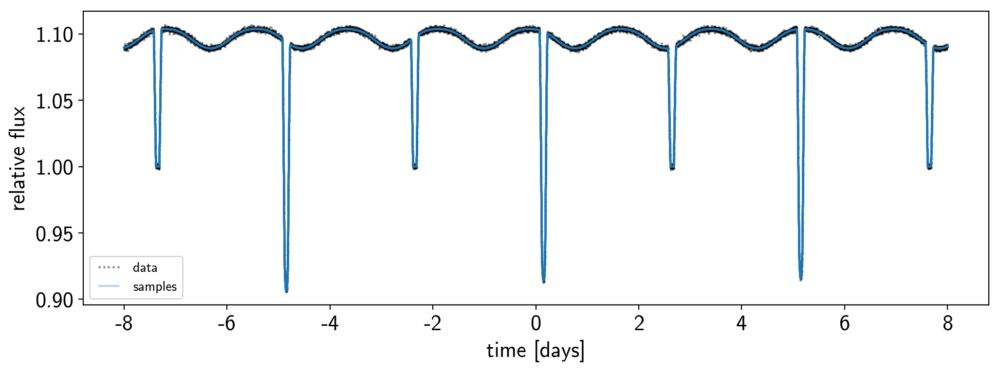

In [19]:
plt.plot(t, flux, 'k.', alpha=0.3, ms=2, label="data")
label = "samples"
for i in np.random.choice(range(len(trace["flux_model"])), 24):
    plt.plot(t, trace["flux_model"][i], "C0-", alpha=0.3, label=label)
    label = None
plt.legend(fontsize=10, numpoints=5)
plt.xlabel("time [days]")
plt.ylabel("relative flux");

Finally, display the true map next to several random samples:

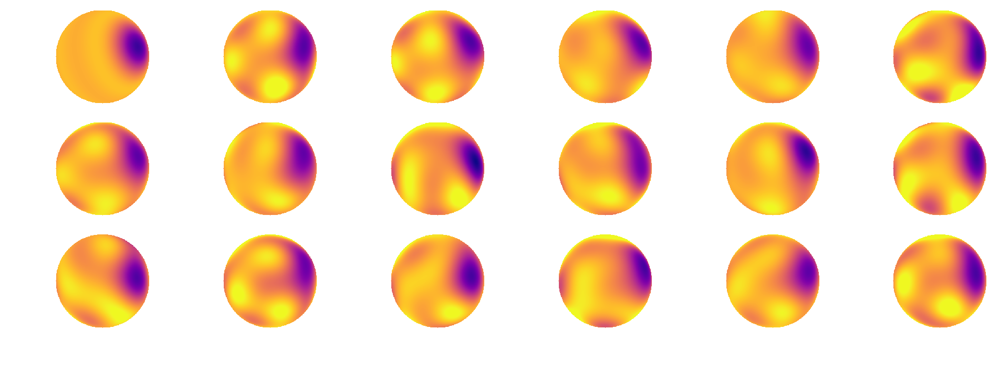

In [20]:
vmin=0
vmax=0.4
nsamp = len(trace["Ylm"])
coeffs = [B_true_map] + [trace["Ylm"][np.random.randint(nsamp)] for i in range(17)]
fig, ax = plt.subplots(3, 6, figsize=(12, 4))
ax = ax.flatten()
for i, coeff in enumerate(coeffs):
    map[1:, :] = coeff
    img = map.render().eval()
    ax[i].imshow(img, origin="lower", vmin=vmin, vmax=vmax, cmap="plasma")
    ax[i].axis('off')